In [2]:
import numpy as np
import os
import scipy.sparse as sparse
from scipy.stats import bernoulli, poisson, ttest_ind, ttest_rel
import analysis_utils_mine as utils

import plotly.graph_objects as go
import chart_studio
import json
import pandas as pd
import ast
from datetime import datetime
import torch
import pandas as pd
from datetime import datetime, timedelta

### original TBIP on senate speeches

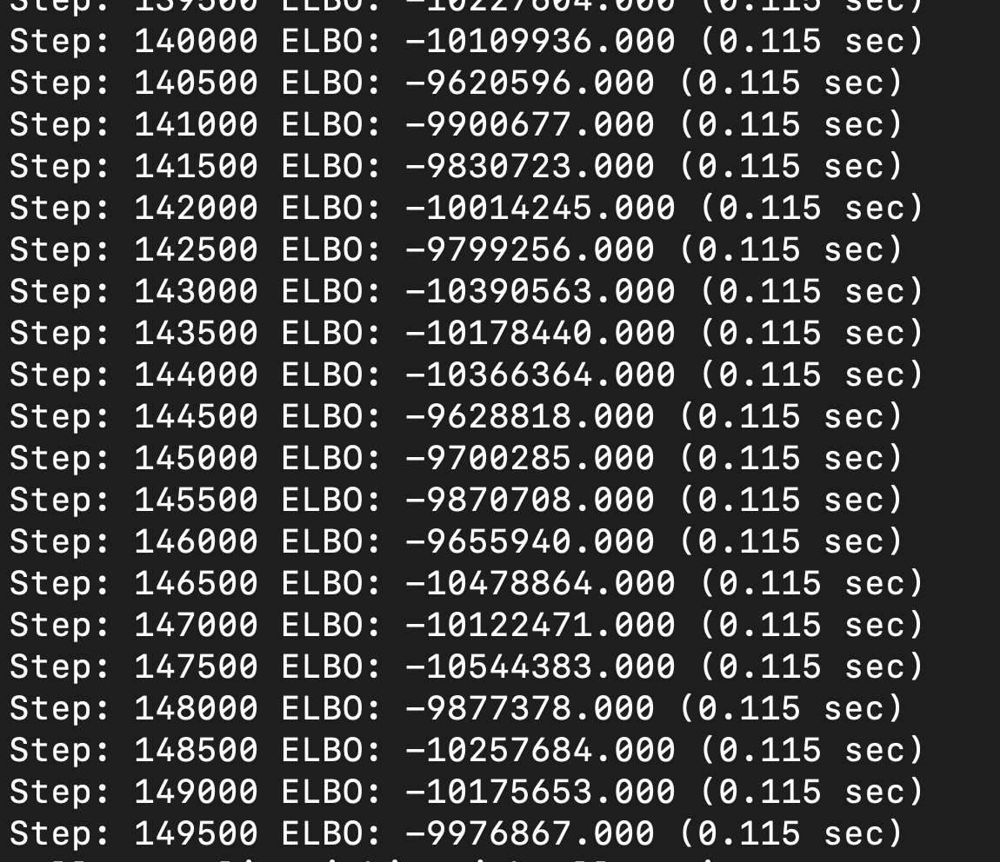

In [83]:
project_dir = os.path.abspath('/workspace/pranav/tbip/') 
source_dir = os.path.join(project_dir, "data/senate-speeches-114")

# Load TBIP data.
data_dir = os.path.join(source_dir, "clean")
(counts, vocabulary, author_indices, 
 author_map) = utils.load_text_data(data_dir)

# Load TBIP parameters.
param_dir = os.path.join(source_dir, "tbip-pytorch-fits-og/params/")
(document_loc, document_scale, objective_topic_loc, objective_topic_scale, 
 ideological_topic_loc, ideological_topic_scale, ideal_point_loc, 
 ideal_point_scale) = utils.load_tbip_parameters(param_dir)

# Compute means from variational parameters
document_mean = np.exp(document_loc + document_scale ** 2 / 2)
objective_topic_mean = np.exp(objective_topic_loc + 
                              objective_topic_scale ** 2 / 2)
ideological_topic_mean = ideological_topic_loc
ideal_point_mean = ideal_point_loc

In [84]:
print(document_mean.shape)
print(objective_topic_mean.shape)
print(ideological_topic_mean.shape)
print(ideal_point_mean.shape)
ideal_point_mean = -1*ideal_point_mean
ideological_topic_loc = ideological_topic_loc * -1

(19009, 50)
(50, 14503)
(50, 14503)
(99,)


In [4]:
utils.print_topics(objective_topic_loc, 
                   objective_topic_scale, 
                   ideological_topic_loc, 
                   ideological_topic_scale, 
                   vocabulary, 
                   20)

['Ideal Point = -1.0, Topic = 0: school, students, access, kids, schools, highquality, children, poverty, early learning, high school, title, learning, learn, teachers, student, resources, graduate, public education, districts, country'
 'Ideal Point = -0.5, Topic = 0: students, schools, school, children, kids, education, teachers, parents, learning, access, student, states, high school, learn, highquality, poverty, title, elementary, educational, state'
 'Ideal Point = 0.0, Topic = 0: students, schools, education, school, children, teachers, states, parents, kids, state, child left behind, teacher, elementary, educational, learning, student, murray, public schools, federal, alexander'
 'Ideal Point = 0.5, Topic = 0: education, schools, states, students, teachers, state, children, parents, child left behind, school, standards, teacher, murray, common core, elementary, federal, school boards, local, school board, classroom'
 'Ideal Point = 1.0, Topic = 0: education, common core, bureauc

In [55]:
%%capture cap --no-stderr
utils.print_topics(objective_topic_loc, 
                   objective_topic_scale, 
                   ideological_topic_loc, 
                   ideological_topic_scale, 
                   vocabulary, 
                   20)
with open(os.path.join(source_dir, 'topics_og_tbip.txt'), 'w') as f:
    f.write(cap.stdout)

In [6]:
sanders_index = np.where(author_map == "Bernard Sanders (I)")[0][0]
sanders_tbip_rank = np.sum(
    ideal_point_mean <= ideal_point_mean[sanders_index])
sanders_tbip_rotated_rank = np.sum(
    ideal_point_mean >= ideal_point_mean[sanders_index])
print("Bernie Sanders has the {}st most extreme TBIP ideal point "
      "for Senate speeches".format(np.minimum(sanders_tbip_rank, 
                                              sanders_tbip_rotated_rank)))

Bernie Sanders has the 1st most extreme TBIP ideal point for Senate speeches


In [7]:
for a in author_map:
    print(a + '\t' + str(ideal_point_mean[np.where(author_map == a)[0][0]]))

Alan Franken (D)	-0.2564349
Amy Klobuchar (D)	-0.12680814
Angus King (I)	-0.050267715
Barbara Boxer (D)	-0.2510865
Barbara Mikulski (D)	-0.19174968
Benjamin Cardin (D)	-0.161627
Benjamin Sasse (R)	0.24798894
Bernard Sanders (I)	-0.44580102
Bill Cassidy (R)	0.1257491
Bill Nelson (D)	-0.0011417846
Bob Corker (R)	0.33360097
Brian Schatz (D)	-0.18748894
Charles Grassley (R)	0.10458831
Charles Schumer (D)	-0.19788969
Chris Coons (D)	-0.16829635
Christopher Murphy (D)	-0.18337482
Claire Mccaskill (D)	-0.057282895
Cory Booker (D)	-0.21757442
Cory Gardner (R)	0.16172384
Dan Sullivan (R)	0.24128675
Daniel Coats (R)	0.20895122
David Perdue (R)	0.30838802
David Vitter (R)	0.06492263
Dean Heller (R)	0.3559119
Deb Fischer (R)	0.22054987
Debbie Stabenow (D)	-0.28988242
Dianne Feinstein (D)	-0.09000329
Edward Markey (D)	-0.2922057
Elizabeth Warren (D)	-0.35379124
Gary Peters (D)	-0.19666246
Harry Reid (D)	-0.26239508
Heidi Heitkamp (D)	-0.07386083
James Inhofe (R)	0.15831067
James Lankford (R)	0.1318

In [85]:
colors = np.array(["crimson" if '(R)' in rep else "steelblue" for rep in author_map])
def get_ideological_topics(objective_topic_loc, 
                           objective_topic_scale,
                           ideological_topic_loc, 
                           ideological_topic_scale,
                           ideal_point):
    ideological_topic_mean = np.exp(objective_topic_loc +
                              ideal_point * ideological_topic_loc +
                              (objective_topic_scale ** 2 + 
                               ideal_point ** 2 * 
                               ideological_topic_scale ** 2) / 2)
    return ideological_topic_mean

In [86]:
ideal_points = ideal_point_mean
author_map = np.array(author_map)
print(author_map.shape)
ideal_points = np.array(ideal_points)
print(ideal_points.shape)

(99,)
(99,)


In [87]:
rep_ideal_points, dem_ideal_points = [], []
for i, rep in enumerate(author_map):
    if '(R)' in rep:
        rep_ideal_points.append(ideal_points[i])
    else:
        dem_ideal_points.append(ideal_points[i])
print(len(rep_ideal_points))
print(len(dem_ideal_points))

53
46


In [88]:
z = ttest_ind(np.array(rep_ideal_points), np.array(dem_ideal_points), equal_var=False)
print(z)

Ttest_indResult(statistic=15.680205354257037, pvalue=2.618207234528271e-28)


In [89]:
print('Separation Value for Republicans and Democrats on overall Ideal Points = ' + str(z[0]))
print('NOTE: Higher value means more separation.')

Separation Value for Republicand and Democrats on overall Ideal Points = 15.680205354257037
NOTE: Higher value means more separation.


In [90]:
dem_cohesion = (1 + np.var(ideal_points))/np.var(dem_ideal_points)
rep_cohesion = (1 + np.var(ideal_points))/np.var(rep_ideal_points)

print('Cohesiveness for Republicans (overall/agg ideal points) = ' + str(rep_cohesion))
print('Cohesiveness for Democrats (overall/agg ideal points) = ' + str(dem_cohesion))
print('NOTE: Higher value is more cohesive; cohesiveness of group also takes into account the spread of all the speakers')

Cohesiveness for Republicans (overall/agg ideal points) = 72.2203547454476
Cohesiveness for Democrats (overall/agg ideal points) = 107.77110872605132
NOTE: Higher value is more cohesive; cohesiveness of group also takes into account the spread of all the speakers


In [28]:
def get_topic_name(topic_number):
    if topic_number == 8:
        topic_name = "Transportation"
    elif topic_number == 16:
        topic_name = "Immigration"
    elif topic_number == 21:
        topic_name = "Budget & Spending"
    elif topic_number == 22:
        topic_name = "Healthcare"
    elif topic_number == 29:
        topic_name = "Abortion"
    elif topic_number == 31:
        topic_name = "Guns"
    elif topic_number == 37:
        topic_name = "Energy"
    elif topic_number == 43:
        topic_name = "Law Enforcement"
    elif topic_number == 45:
        topic_name = "Information/Privacy"
    elif topic_number == 44:
        topic_name = "Trade"
        
    return topic_name

In [15]:
def show_interactive(topic_number):
    topic_name = get_topic_name(topic_number)

    fig = go.Figure(layout = go.Layout(
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)'))
    x_min = -1.0
    x_max = 1.0
    diff = 0.05
    offset = -x_min / diff
    scatterplot_location = -0.53

    ideal_point_dict = {}
    for i in range(int((x_max - x_min) / diff) + 1):
        ideal_point_dict[i] = (i - offset) * diff

    # Add black line.
    fig.add_trace(go.Scatter(x=[x_min, x_max], 
                             y = [scatterplot_location, scatterplot_location],
                             line=dict(color="black", width=1),
                             marker=dict(size=1),
                             hoverinfo='skip'))

    # Add trace for all representatives
    fig.add_trace(go.Scatter(
        mode="markers",
        x=ideal_points, 
        y=scatterplot_location * np.ones(len(ideal_points)), 
        text=[x for x in author_map], 
        hoverinfo="x+text",
        marker=dict(color=colors, size=8)))

    num_top_words = 10

    # Add bar plots, one for each ideal point
    for step in np.arange(len(ideal_point_dict.keys())):
        ideological_topic_mean = get_ideological_topics(objective_topic_loc, 
                                   objective_topic_scale,
                                   ideological_topic_loc, 
                                   ideological_topic_scale,
                                   ideal_point_dict[step])
        topic_intensities = ideological_topic_mean[topic_number]
        top_topic_intensities = np.sort(topic_intensities)[-num_top_words:]
        top_topic_words = vocabulary[np.argsort(-topic_intensities)[:num_top_words]][::-1]
        fig.add_trace(
            go.Bar(
                visible=False,
                x=top_topic_intensities * 5,
                orientation='h',
                text=top_topic_words,
                textposition='outside',
                marker_color='rgb(175,122,197)',
                y0=0.529,
                dy=0.214,
                base=-0.3,
                hoverinfo='skip',
            ))

    fig.update_layout(go.Layout(
    yaxis = {'showgrid': False,
             'showline': False,
             'zeroline': False,
            'showticklabels': False,
            'fixedrange': True}),
    xaxis = {'showgrid': False,
             'showline': False,
             'zeroline': False,
            'showticklabels': False,
            'fixedrange': True})
    fig.update_yaxes(range=[-0.60, 2.5])
    fig.update_xaxes(range=[x_min - 0.01, x_max + 0.02])

    # Set default trace
    fig.data[len(fig.data) // 2].visible = True

    # Create and add slider
    steps = []
    for i in range(2, len(fig.data)):
        step = dict(
            method="update",
            args=[{"visible": [True, True] + [False] * (len(fig.data) - 2)}],  
            label="{:.2f}".format(ideal_point_dict[i - 2]),
        )
        step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
        steps.append(step)

    sliders = [dict(
        active=(len(fig.data) // 2 - 1),
        currentvalue={"prefix": "Ideal Point: "},
        y=0.35,
        steps=steps)]

    fig.update_layout(sliders=sliders, showlegend=False, 
                      title={'text': "Word Usage as a Function of Ideal Point (Topic: {})".format(topic_name),
                             'x': 0.5,
                             'y': 0.9},
                      xaxis_title='Representative ideal points (hover to see names)',
                      annotations = [
                                    dict(xref='paper',
                                            yref='paper',
                                            x=0.5, y=0.255,
                                            font={'size': 14},
                                            showarrow=False,
                                            text ='Move slider to change ideal point')
                      ])
    fig.show()

In [16]:
show_interactive(8)

In [17]:
show_interactive(16)

In [18]:
show_interactive(21)

In [19]:
show_interactive(22)

In [20]:
show_interactive(29)

In [21]:
show_interactive(31)

In [22]:
show_interactive(37)

In [23]:
show_interactive(43)

In [24]:
show_interactive(44)

In [25]:
show_interactive(45)

## issue-specific TBIP

#### I do not think ELBO is indicative of anything really

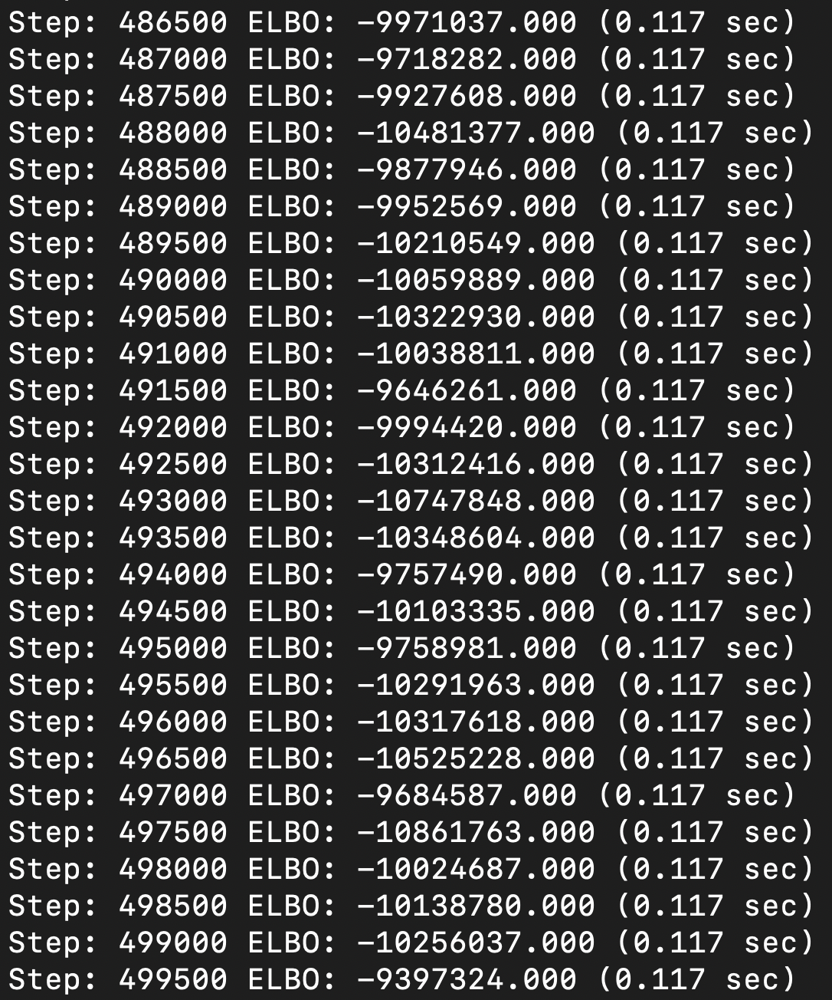

In [3]:
project_dir = os.path.abspath('/workspace/pranav/tbip/') 
source_dir = os.path.join(project_dir, "data/senate-speeches-114")

# Load TBIP data.
data_dir = os.path.join(source_dir, "clean")
(counts, vocabulary, author_indices, 
 author_map) = utils.load_text_data(data_dir)

# Load TBIP parameters.
param_dir = os.path.join(source_dir, "tbip-pytorch-fits-issue-specific/params/")
(document_loc, document_scale, objective_topic_loc, objective_topic_scale, 
 ideological_topic_loc, ideological_topic_scale, ideal_point_loc, 
 ideal_point_scale) = utils.load_tbip_parameters(param_dir)

# Compute means from variational parameters
document_mean = np.exp(document_loc + document_scale ** 2 / 2)
objective_topic_mean = np.exp(objective_topic_loc + 
                              objective_topic_scale ** 2 / 2)
ideological_topic_mean = ideological_topic_loc
ideal_point_mean = ideal_point_loc

In [4]:
print(document_mean.shape)
print(objective_topic_mean.shape)
print(ideological_topic_mean.shape)
print(ideal_point_mean.shape)

(19009, 50)
(50, 14503)
(50, 14503)
(99, 50)


In [5]:
utils.print_topics(objective_topic_loc, 
                   objective_topic_scale, 
                   ideological_topic_loc, 
                   ideological_topic_scale, 
                   vocabulary, 
                   20)

['Ideal Point = -1.0, Topic = 0: child left behind, states, schools, education, teachers, fix, state, children, parents, murray, public schools, students, school board, standards, accountability, elementary, tests, school, common core, federal'
 'Ideal Point = -0.5, Topic = 0: schools, education, students, states, children, teachers, parents, school, child left behind, state, kids, murray, elementary, public schools, teacher, federal, accountability, fix, standards, classroom'
 'Ideal Point = 0.0, Topic = 0: students, schools, education, school, children, teachers, parents, states, kids, learning, state, educational, elementary, teacher, student, child left behind, alexander, learn, murray, federal'
 'Ideal Point = 0.5, Topic = 0: students, school, schools, education, children, college, learning, kids, high school, student, educational, skills, parents, programs, teachers, career, states, technical, workforce, opportunities'
 'Ideal Point = 1.0, Topic = 0: career, students, technical, 

In [33]:
%%capture cap --no-stderr
utils.print_topics(objective_topic_loc, 
                   objective_topic_scale, 
                   ideological_topic_loc, 
                   ideological_topic_scale, 
                   vocabulary, 
                   20)
with open(os.path.join(source_dir, 'topics_issue_specific_tbip_att1.txt'), 'w') as f:
    f.write(cap.stdout)

In [6]:
ideal_point_mean_mean = ideal_point_mean.mean(axis=1)
print(ideal_point_mean_mean.shape)

(99,)


In [34]:
sanders_index = np.where(author_map == "Bernard Sanders (I)")[0][0]
sanders_tbip_rank = np.sum(
    ideal_point_mean_mean <= ideal_point_mean_mean[sanders_index])
sanders_tbip_rotated_rank = np.sum(
    ideal_point_mean_mean >= ideal_point_mean_mean[sanders_index])
print("Bernie Sanders has the {}st most extreme TBIP ideal point averaged across all topics"
      " for Senate speeches".format(np.minimum(sanders_tbip_rank, 
                                              sanders_tbip_rotated_rank)))

Bernie Sanders has the 47st most extreme TBIP ideal point averaged across all topics for Senate speeches


In [35]:
ideal_point_mean_max = ideal_point_mean.max(axis=1)
print(ideal_point_mean_max.shape)

(99,)


In [28]:
ideal_point_mean_min = ideal_point_mean.min(axis=1)
print(ideal_point_mean_min.shape)

(99,)


In [29]:
for a in author_map:
    print(a + '\t' + str(ideal_point_mean_min[np.where(author_map == a)[0][0]]) + '\t' + str(ideal_point_mean_mean[np.where(author_map == a)[0][0]]) + '\t' + str(ideal_point_mean_max[np.where(author_map == a)[0][0]]))

Alan Franken (D)	-0.55512935	0.023210669	0.70821
Amy Klobuchar (D)	-0.71993935	0.027476925	1.2792822
Angus King (I)	-0.6255862	0.049528684	0.47143558
Barbara Boxer (D)	-0.95449317	-0.03195014	0.67152184
Barbara Mikulski (D)	-0.9613297	0.06886962	0.9408953
Benjamin Cardin (D)	-0.6012847	0.007681774	0.7625598
Benjamin Sasse (R)	-1.0019737	-0.13646847	0.83505946
Bernard Sanders (I)	-1.2158153	-0.029293694	0.9419837
Bill Cassidy (R)	-0.91015667	-0.00539381	1.0204183
Bill Nelson (D)	-1.2887298	0.0092171095	0.93911445
Bob Corker (R)	-1.0364031	-0.034128163	2.002268
Brian Schatz (D)	-0.70450795	-0.015752275	0.7384268
Charles Grassley (R)	-1.0132496	-0.035348512	0.78574467
Charles Schumer (D)	-0.7517271	0.02181844	0.75997424
Chris Coons (D)	-0.64855576	-0.042644907	0.5133794
Christopher Murphy (D)	-0.9853112	-0.011713871	1.2079275
Claire Mccaskill (D)	-0.85874534	-0.06144624	0.4505785
Cory Booker (D)	-0.6614527	0.034447387	0.7429334
Cory Gardner (R)	-1.0789052	-0.09553491	0.5589323
Dan Sulliva

In [30]:
ideal_point_mean_median = np.median(ideal_point_mean, axis=1)
print(ideal_point_mean_median.shape)

(99,)


In [31]:
sanders_index = np.where(author_map == "Bernard Sanders (I)")[0][0]
sanders_tbip_rank = np.sum(
    ideal_point_mean_median <= ideal_point_mean_median[sanders_index])
sanders_tbip_rotated_rank = np.sum(
    ideal_point_mean_median >= ideal_point_mean_median[sanders_index])
print("Bernie Sanders has the {}st most extreme TBIP ideal point - median across all topics "
      " for Senate speeches".format(np.minimum(sanders_tbip_rank, 
                                              sanders_tbip_rotated_rank)))

Bernie Sanders has the 39st most extreme TBIP ideal point - median across all topics  for Senate speeches


In [32]:
for a in author_map:
    print(a + '\t' + str(ideal_point_mean_median[np.where(author_map == a)[0][0]]))

Alan Franken (D)	-0.0072887717
Amy Klobuchar (D)	0.05920721
Angus King (I)	0.111998886
Barbara Boxer (D)	-0.037430383
Barbara Mikulski (D)	0.0985432
Benjamin Cardin (D)	-0.012491457
Benjamin Sasse (R)	-0.09246944
Bernard Sanders (I)	-0.034730583
Bill Cassidy (R)	0.050469205
Bill Nelson (D)	0.06563017
Bob Corker (R)	-0.039556004
Brian Schatz (D)	0.016383516
Charles Grassley (R)	-0.07472086
Charles Schumer (D)	0.07588498
Chris Coons (D)	-0.07586525
Christopher Murphy (D)	0.014917873
Claire Mccaskill (D)	-0.07972346
Cory Booker (D)	0.05137748
Cory Gardner (R)	-0.034194175
Dan Sullivan (R)	-0.1189949
Daniel Coats (R)	-0.05023375
David Perdue (R)	-0.051324844
David Vitter (R)	-0.0012400385
Dean Heller (R)	0.039334517
Deb Fischer (R)	-0.068534955
Debbie Stabenow (D)	-0.0029479754
Dianne Feinstein (D)	0.05939222
Edward Markey (D)	-0.06006173
Elizabeth Warren (D)	0.13068354
Gary Peters (D)	0.017351441
Harry Reid (D)	-0.004502819
Heidi Heitkamp (D)	0.066503294
James Inhofe (R)	-0.057858918
Jame

In [7]:
def get_topic_name(topic_number):
    if topic_number == 8:
        topic_name = "Transportation"
    elif topic_number == 16:
        topic_name = "Immigration"
    elif topic_number == 21:
        topic_name = "Budget & Spending"
    elif topic_number == 22:
        topic_name = "Healthcare"
    elif topic_number == 29:
        topic_name = "Abortion"
    elif topic_number == 31:
        topic_name = "Guns"
    elif topic_number == 37:
        topic_name = "Energy"
    elif topic_number == 43:
        topic_name = "Law Enforcement"
    elif topic_number == 45:
        topic_name = "Information/Privacy"
    elif topic_number == 44:
        topic_name = "Trade"
        
    return topic_name

In [8]:
np.max(ideal_point_mean)

2.1388361

In [9]:
np.min(ideal_point_mean)

-2.4262247

In [10]:
colors = np.array(["crimson" if '(R)' in rep else "steelblue" for rep in author_map])
def get_ideological_topics(objective_topic_loc, 
                           objective_topic_scale,
                           ideological_topic_loc, 
                           ideological_topic_scale,
                           ideal_point):
    ideological_topic_mean = np.exp(objective_topic_loc +
                              ideal_point * ideological_topic_loc +
                              (objective_topic_scale ** 2 + 
                               ideal_point ** 2 * 
                               ideological_topic_scale ** 2) / 2)
    return ideological_topic_mean

In [11]:

author_map = np.array(author_map)
print(author_map.shape)
# ideal_points = np.array(ideal_points)
# print(ideal_points.shape)

(99,)


In [12]:
def get_agg_avg_matrix(X, dic_of_inds):
    list_of_arrays = []
    for a in dic_of_inds:
        inds = dic_of_inds[a]
        list_of_arrays.append(np.mean(X[inds], 0).reshape((1, X.shape[1])))
    return np.concatenate(list_of_arrays, 0)

In [13]:
author_to_inds = {}
for i in range(len(author_map)):
    author_to_inds[i] = []
for j, a in enumerate(author_indices):
    author_to_inds[a].append(j)
#print(author_to_inds)

In [14]:
mean_topic_props = get_agg_avg_matrix(np.array(torch.softmax(torch.from_numpy(document_mean), 1)), author_to_inds)
print(mean_topic_props.shape)

(99, 50)


In [15]:
def show_interactive(topic_number):
    ideal_points = ideal_point_mean[:, topic_number]
    avg_topic_props = mean_topic_props[:, topic_number]
    try:
        topic_name = get_topic_name(topic_number)
    except:
        topic_name = 'Topic ' + str(topic_number)
    fig = go.Figure(layout = go.Layout(
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)'))
    x_min = np.min(ideal_points)
    x_max = np.max(ideal_points)
    if abs(x_min)>x_max:
        x_max = -1*x_min
    else:
        x_min = -1*x_max
    diff = 0.05
    offset = -x_min / diff
    scatterplot_location = -0.53

    ideal_point_dict = {}
    for i in range(int((x_max - x_min) / diff) + 1):
        ideal_point_dict[i] = (i - offset) * diff

    # Add black line.
    fig.add_trace(go.Scatter(x=[x_min, x_max], 
                             y = [scatterplot_location, scatterplot_location],
                             line=dict(color="black", width=1),
                             marker=dict(size=1),
                             hoverinfo='skip'))

    # Add trace for all representatives
    fig.add_trace(go.Scatter(
        mode="markers",
        x=ideal_points, 
        y=scatterplot_location * np.ones(len(ideal_points)), 
        text=[x + ' [' + str(round(avg_topic_props[ind], 3)) + ']' for ind, x in enumerate(author_map)], 
        hoverinfo="x+text",
        marker=dict(color=colors, size=8)))

    num_top_words = 10

    # Add bar plots, one for each ideal point
    for step in np.arange(len(ideal_point_dict.keys())):
        ideological_topic_mean = get_ideological_topics(objective_topic_loc, 
                                   objective_topic_scale,
                                   ideological_topic_loc, 
                                   ideological_topic_scale,
                                   ideal_point_dict[step])
        topic_intensities = ideological_topic_mean[topic_number]
        top_topic_intensities = np.sort(topic_intensities)[-num_top_words:]
        top_topic_words = vocabulary[np.argsort(-topic_intensities)[:num_top_words]][::-1]
        fig.add_trace(
            go.Bar(
                visible=False,
                x=top_topic_intensities * 5,
                orientation='h',
                text=top_topic_words,
                textposition='outside',
                marker_color='rgb(175,122,197)',
                y0=0.529,
                dy=0.214,
                base=-0.3,
                hoverinfo='skip',
            ))

    fig.update_layout(go.Layout(
    yaxis = {'showgrid': False,
             'showline': False,
             'zeroline': False,
            'showticklabels': False,
            'fixedrange': True}),
    xaxis = {'showgrid': False,
             'showline': False,
             'zeroline': False,
            'showticklabels': False,
            'fixedrange': True})
    fig.update_yaxes(range=[-0.60, 2.5])
    fig.update_xaxes(range=[x_min - 0.01, x_max + 0.02])

    # Set default trace
    fig.data[len(fig.data) // 2].visible = True

    # Create and add slider
    steps = []
    for i in range(2, len(fig.data)):
        step = dict(
            method="update",
            args=[{"visible": [True, True] + [False] * (len(fig.data) - 2)}],  
            label="{:.2f}".format(ideal_point_dict[i - 2]),
        )
        step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
        steps.append(step)

    sliders = [dict(
        active=(len(fig.data) // 2 - 1),
        currentvalue={"prefix": "Ideal Point: "},
        y=0.35,
        steps=steps)]

    fig.update_layout(sliders=sliders, showlegend=False, 
                      title={'text': "Word Usage as a Function of Ideal Point (Topic: {})".format(topic_name),
                             'x': 0.5,
                             'y': 0.9},
                      xaxis_title='Representative ideal points (hover to see names)',
                      annotations = [
                                    dict(xref='paper',
                                            yref='paper',
                                            x=0.5, y=0.255,
                                            font={'size': 14},
                                            showarrow=False,
                                            text ='Move slider to change ideal point')
                      ])
    fig.show()
    rep_ideal_points, dem_ideal_points = [], []
    for i, rep in enumerate(author_map):
        if '(R)' in rep:
            rep_ideal_points.append(ideal_points[i])
        else:
            dem_ideal_points.append(ideal_points[i])
    z = ttest_ind(np.array(rep_ideal_points), np.array(dem_ideal_points), equal_var=False)
    print('')
    print('Separation Value for Republicans and Democrats on issue-specific ideal points for ' + topic_name + ' = ' + str(abs(z[0])) + ' (' + str(z[1]) + ')')
    print('NOTE: Higher value means more separation.')
    
    dem_cohesion = (1 + np.var(ideal_points))/np.var(dem_ideal_points)
    rep_cohesion = (1 + np.var(ideal_points))/np.var(rep_ideal_points)
    print('')
    print('Cohesiveness for Republicans on ' + topic_name + ' = ' + str(rep_cohesion))
    print('Cohesiveness for Democrats on ' + topic_name + ' = ' + str(dem_cohesion))
    print('NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue')
    #return z

In [16]:
show_interactive(8)


Separation Value for Republicans and Democrats on issue-specific ideal points for Transportation = 1.889356369935072 (0.06255766590262364)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Transportation = 23.638343181260627
Cohesiveness for Democrats on Transportation = 11.178281903145725
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Bill Nelson, John Thurne, Richard Blumenthal, Roger Wicker all were prominent members of the United States Senate Committee on Commerce, Science, and Transportation.

In [17]:
#print(list(senate_speeches_114[senate_speeches_114['Speaker Bioguide ID']=="C000174"]['Text']))

In [18]:
show_interactive(16)


Separation Value for Republicans and Democrats on issue-specific ideal points for Immigration = 6.394120338683144 (1.1906247675228449e-08)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Immigration = 38.982782161028126
Cohesiveness for Democrats on Immigration = 16.949363291004836
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


### Richard Durbin is prominent in immigration reform, leading bipartisan efforts to chart a pathway to citizenship for dreamers or children of illegal immigrants, one of the sponsors of bipartisan immigration reform bills introduced in every past recent congress. 

### Sessions and Cruz are well known for their hard anti-immigration stance, vocally opposing any bipartisan reform or talks of comprehensive immigration reform. While cruz talks about championing legal immigration, Sessions was opposed to both legal and illegal immigration during his time in congress. 

In [19]:
show_interactive(21)


Separation Value for Republicans and Democrats on issue-specific ideal points for Budget & Spending = 8.495584528556275 (1.2492328215068528e-12)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Budget & Spending = 30.782862701445925
Cohesiveness for Democrats on Budget & Spending = 13.360711943391427
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [20]:
show_interactive(22)


Separation Value for Republicans and Democrats on issue-specific ideal points for Healthcare = 9.88848039546074 (2.9598028301763197e-16)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Healthcare = 14.327847335131331
Cohesiveness for Democrats on Healthcare = 26.379567401133187
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Robert Casey was on Committee on Health, Education, Labor, and Pensions - Subcommittee on Children and Families (Ranking Member)

In [21]:
show_interactive(29)


Separation Value for Republicans and Democrats on issue-specific ideal points for Abortion = 7.207151918361639 (9.72933659924008e-10)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Abortion = 40.22322298848973
Cohesiveness for Democrats on Abortion = 8.716302719458389
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Susan Collins is supposed to be more pro-choice than most republicans, but Bill Cassidy seems to fully 'pro-life'. While Patty Murray is firmly pro-choice, not clear why she is most 'liberal' on the issue - she is the chair of Committee on Health, Education, Labor, and Pensions though. 

#### Note that the 5 most liberal democratic senators on this topic are all women.

In [22]:
show_interactive(31)


Separation Value for Republicans and Democrats on issue-specific ideal points for Guns = 10.786522837946364 (1.520892707304257e-17)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Guns = 21.609511567729978
Cohesiveness for Democrats on Guns = 12.979553076239066
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Jon Tester (D) from Montana is somewhat republican-like on the issue of guns - Tester is a gun owner. On gun rights, the National Rifle Association has given him an A- rating,  but another gun rights group, Gun Owners of America, has given Tester a rating of F. Tester supports efforts to loosen restrictions on gun exports, stating such an action would help U.S. gun manufacturers expand their business and would create more jobs. In 2016, Tester voted against a Democrat-sponsored proposal that would have required background checks for purchases at gun shows and for purchases of guns online nationwide. He argued that the bill would "have blocked family members and neighbors from buying and selling guns to one another without a background check." Tester voted for a second Democrat-sponsored proposal to ban gun sales to individuals on the terrorist watch list. Both proposals failed. 

#### Pat Toomey (R), Pennsylvania, In 2013, in response to the Sandy Hook Elementary School shooting, Toomey and Democratic Senator Joe Manchin introduced legislation that would have required a background check for most gun sales. The legislation failed and failed again when it was reintroduced in 2015.[80] In 2016, Toomey voted against a bill that would prohibit gun purchases by people on the no-fly list. Toomey opposed President Obama's executive orders on gun control as contrary to the constitutional system of checks and balances, but believes Congress should pass background checks. He received nearly 93,000 from gun-rights groups including the National Rifle Association, but earned a poor rating (a "C") from the NRA after he started championing background check legislation. 

#### Chris Murphy (D) is certainly strong gun control advocate (more details on wiki, he even recently published a book on gun control). Murphy has an F rating with the National Rifle Association and a 100% rating with the Brady Campaign to Prevent Gun Violence. The Sandy Hook Elementary School shooting occurred in Newtown, Connecticut, within Murphy's House district near the end of his term. In the aftermath of the shooting, he became a leading voice in the movement to prevent gun violence, supporting numerous policies including universal background checks and ending the ban on gun violence research at the CDC. 

In [23]:
show_interactive(37)


Separation Value for Republicans and Democrats on issue-specific ideal points for Energy = 5.8656397064588806 (6.644962253753498e-08)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Energy = 19.54515335454052
Cohesiveness for Democrats on Energy = 37.75551874479831
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Markey is a progressive who has focused on climate change and energy policy and was chair of the House Select Committee on Energy Independence and Global Warming from 2007 to 2011. Markey is the Senate author of the Green New Deal. 

#### Hoeven believes that alternative fuels are a long-term solution but that increased oil drilling is required in the short term. He has been a vocal advocate for the Keystone Pipeline, claiming that it has never leaked and that environmental risks have been exaggerated. The Keystone Pipeline has in fact leaked twice, in 2010 and in 2016. In 2015, Hoeven submitted an amendment asserting that climate change is real and that humans are contributing to it but also that the Keystone Pipeline would not contribute to climate change. His League of Conservation Voters score was 7% for 2018. 

In [24]:
show_interactive(43)


Separation Value for Republicans and Democrats on issue-specific ideal points for Law Enforcement = 3.506195734753883 (0.0007025084403099112)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Law Enforcement = 9.329931330167705
Cohesiveness for Democrats on Law Enforcement = 8.100164984197727
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [25]:
show_interactive(44)


Separation Value for Republicans and Democrats on issue-specific ideal points for Trade = 4.135670685576734 (9.214230871098809e-05)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Trade = 38.61742133200297
Cohesiveness for Democrats on Trade = 15.700311377107331
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [26]:
show_interactive(45)


Separation Value for Republicans and Democrats on issue-specific ideal points for Information/Privacy = 0.010647957978115836 (0.9915264976864032)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Information/Privacy = 7.685305618456467
Cohesiveness for Democrats on Information/Privacy = 8.091201588116991
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Rand Paul: As a critic of warrantless surveillance of Americans, Paul says "the Fourth Amendment is equally as important as the Second Amendment" and has called for conservatives to more strongly defend Fourth Amendment rights. In 2015 Paul spoke for ten and a half hours on the Senate floor against renewing provisions of the PATRIOT Act that he said were unconstitutional. Paul has called Edward Snowden a "whistleblower" and called for Director of National Intelligence James Clapper to resign for "lying" about the phone metadata program that Snowden exposed. He also filed a class action lawsuit against the Obama administration seeking to end the program. Paul gave a speech at the University of California, Berkeley in 2014 titled "The N.S.A. vs. Your Privacy"

### Note - most senators don't even have a separate wiki section of govt surveillance in their wiki unlike Rand Paul.


In [27]:
show_interactive(13)


Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 13 = 3.9785613263632587 (0.0001443492217394736)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 13 = 13.10726106191622
Cohesiveness for Democrats on Topic 13 = 8.391930506597307
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [28]:
show_interactive(14)


Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 14 = 1.8800065831517037 (0.06325316091738606)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 14 = 11.676516693026146
Cohesiveness for Democrats on Topic 14 = 10.035977252295375
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Portman and Brown are Ohio senators (Cincinnati is in Ohio)

In [29]:
show_interactive(17)


Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 17 = 1.9039061856908441 (0.06105027517087045)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 17 = 19.213676274465822
Cohesiveness for Democrats on Topic 17 = 6.412708620491185
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


#### Progressives like Warren, Brown, Merkeley mentioning wall street more makes sense (Merkley has focused on Wall Street reform in his position on the Senate Banking Committee). 

#### Crapo (R) has been on Committee on Banking, Housing, and Urban Affairs including Financial Institutions subcommittee.  - same goes for Bob Corker (R), both for deregulation of bank and wall street oversight and scrutiny. 

In [30]:
#get the topic with the most and least separation between Republicans and Democrats
num_topics = ideal_point_mean.shape[1]

sep_scores = []

for topic_number in range(num_topics):
    ideal_points = ideal_point_mean[:, topic_number]
    rep_ideal_points, dem_ideal_points = [], []
    for i, rep in enumerate(author_map):
        if '(R)' in rep:
            rep_ideal_points.append(ideal_points[i])
        else:
            dem_ideal_points.append(ideal_points[i])
    z = ttest_ind(np.array(rep_ideal_points), np.array(dem_ideal_points), equal_var=False)
    sep_scores.append((topic_number, z[0]))
sep_scores = sorted(sep_scores, key=lambda x:abs(x[1]))

In [31]:
print('Topic with Least Separation between Republicans and Democrats - ')
show_interactive(sep_scores[0][0])

Topic with Least Separation between Republicans and Democrats - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 41 = 0.0048775335882867595 (0.9961186541504815)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 41 = 11.408170218882546
Cohesiveness for Democrats on Topic 41 = 10.59010314541099
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [32]:
print('Topic with Most Separation between Republicans and Democrats - ')
show_interactive(sep_scores[-1][0])

Topic with Most Separation between Republicans and Democrats - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Guns = 10.786522837946364 (1.520892707304257e-17)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Guns = 21.609511567729978
Cohesiveness for Democrats on Guns = 12.979553076239066
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [38]:
#get the topic with the most and least cohesion for both Republicans and Democrats.
num_topics = ideal_point_mean.shape[1]

cohesion_scores_dem = []
cohesion_scores_rep = []

for topic_number in range(num_topics):
    ideal_points = ideal_point_mean[:, topic_number]
    rep_ideal_points, dem_ideal_points = [], []
    for i, rep in enumerate(author_map):
        if '(R)' in rep:
            rep_ideal_points.append(ideal_points[i])
        else:
            dem_ideal_points.append(ideal_points[i])
    dem_cohesion = (1 + np.var(ideal_points))/np.var(dem_ideal_points)
    rep_cohesion = (1 + np.var(ideal_points))/np.var(rep_ideal_points)
    cohesion_scores_dem.append((topic_number, dem_cohesion))
    cohesion_scores_rep.append((topic_number, rep_cohesion))
    
cohesion_scores_dem = sorted(cohesion_scores_dem, key=lambda x:x[1])
cohesion_scores_rep = sorted(cohesion_scores_rep, key=lambda x:x[1])

In [39]:
print('Topic where Republicans are least cohesive - ')
show_interactive(cohesion_scores_rep[0][0])

Topic where Republicans are least cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 6 = 1.0408038396480697 (0.30192951619127484)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 6 = 3.797260180092018
Cohesiveness for Democrats on Topic 6 = 39.695609901549716
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [40]:
print('Topic where Republicans are 2nd least cohesive - ')
show_interactive(cohesion_scores_rep[1][0])

Topic where Republicans are 2nd least cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 1 = 1.507373601189626 (0.13503344291087732)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 1 = 6.0743455165648825
Cohesiveness for Democrats on Topic 1 = 10.912391221308582
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [42]:
print('Topic where Republicans are 3rd least cohesive - ')
show_interactive(cohesion_scores_rep[2][0])

Topic where Republicans are 3rd least cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 18 = 1.4620729554652765 (0.14729369366882963)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 18 = 6.883374539284062
Cohesiveness for Democrats on Topic 18 = 18.389360705269876
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [43]:
print('Topic where Republicans are most cohesive - ')
show_interactive(cohesion_scores_rep[-1][0])

Topic where Republicans are most cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Abortion = 7.207151918361639 (9.72933659924008e-10)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Abortion = 40.22322298848973
Cohesiveness for Democrats on Abortion = 8.716302719458389
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [44]:
print('Topic where Republicans are 2nd most cohesive - ')
show_interactive(cohesion_scores_rep[-2][0])

Topic where Republicans are 2nd most cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Immigration = 6.394120338683144 (1.1906247675228449e-08)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Immigration = 38.982782161028126
Cohesiveness for Democrats on Immigration = 16.949363291004836
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [45]:
print('Topic where Republicans are 3rd most cohesive - ')
show_interactive(cohesion_scores_rep[-3][0])

Topic where Republicans are 3rd most cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Trade = 4.135670685576734 (9.214230871098809e-05)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Trade = 38.61742133200297
Cohesiveness for Democrats on Trade = 15.700311377107331
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [46]:
print('Topic where Democrats are least cohesive - ')
show_interactive(cohesion_scores_dem[0][0])

Topic where Democrats are least cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 15 = 0.8409330529665962 (0.40289471650687914)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 15 = 11.733934035300425
Cohesiveness for Democrats on Topic 15 = 5.96378187335272
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [47]:
print('Topic where Democrats are 2nd least cohesive - ')
show_interactive(cohesion_scores_dem[1][0])

Topic where Democrats are 2nd least cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 10 = 5.782816482050261 (2.5678766293663416e-07)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 10 = 27.36116448231185
Cohesiveness for Democrats on Topic 10 = 6.139142273439136
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [48]:
print('Topic where Democrats are 3rd least cohesive - ')
show_interactive(cohesion_scores_dem[2][0])

Topic where Democrats are 3rd least cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 17 = 1.9039061856908441 (0.06105027517087045)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 17 = 19.213676274465822
Cohesiveness for Democrats on Topic 17 = 6.412708620491185
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [49]:
print('Topic where Democrats are most cohesive - ')
show_interactive(cohesion_scores_dem[-1][0])

Topic where Democrats are most cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 5 = 1.4559127936695624 (0.1505046106426229)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 5 = 14.053310106208048
Cohesiveness for Democrats on Topic 5 = 175.13095165979303
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [50]:
print('Topic where Democrats are 2nd most cohesive - ')
show_interactive(cohesion_scores_dem[-2][0])

Topic where Democrats are 2nd most cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 35 = 1.9252541242461632 (0.05884799392654934)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 35 = 12.46086039951953
Cohesiveness for Democrats on Topic 35 = 160.1379457410293
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [51]:
print('Topic where Democrats are 3rd most cohesive - ')
show_interactive(cohesion_scores_dem[-3][0])

Topic where Democrats are 3rd most cohesive - 



Separation Value for Republicans and Democrats on issue-specific ideal points for Topic 33 = 1.458185998563703 (0.14862043573985922)
NOTE: Higher value means more separation.

Cohesiveness for Republicans on Topic 33 = 20.05350863348711
Cohesiveness for Democrats on Topic 33 = 70.0616009381066
NOTE: Higher value means more cohesive; cohesiveness of group also takes into account the spread of all the speakers on the issue


In [55]:
import chart_studio
chart_studio.tools.set_credentials_file(username='pg96', api_key='NDcsdaKUnDc6rrurwLmg')

In [56]:
import chart_studio.plotly as py

In [57]:
def save_interactive(topic_number):
    ideal_points = ideal_point_mean[:, topic_number]
    avg_topic_props = mean_topic_props[:, topic_number]
    try:
        topic_name = get_topic_name(topic_number)
    except:
        topic_name = 'Topic ' + str(topic_number)
    fig = go.Figure(layout = go.Layout(
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)'))
    x_min = np.min(ideal_points)
    x_max = np.max(ideal_points)
    if abs(x_min)>x_max:
        x_max = -1*x_min
    else:
        x_min = -1*x_max
    diff = 0.05
    offset = -x_min / diff
    scatterplot_location = -0.53

    ideal_point_dict = {}
    for i in range(int((x_max - x_min) / diff) + 1):
        ideal_point_dict[i] = (i - offset) * diff

    # Add black line.
    fig.add_trace(go.Scatter(x=[x_min, x_max], 
                             y = [scatterplot_location, scatterplot_location],
                             line=dict(color="black", width=1),
                             marker=dict(size=1),
                             hoverinfo='skip'))

    # Add trace for all representatives
    fig.add_trace(go.Scatter(
        mode="markers",
        x=ideal_points, 
        y=scatterplot_location * np.ones(len(ideal_points)), 
        text=[x + ' [' + str(round(avg_topic_props[ind], 3)) + ']' for ind, x in enumerate(author_map)], 
        hoverinfo="x+text",
        marker=dict(color=colors, size=8)))

    num_top_words = 10

    # Add bar plots, one for each ideal point
    for step in np.arange(len(ideal_point_dict.keys())):
        ideological_topic_mean = get_ideological_topics(objective_topic_loc, 
                                   objective_topic_scale,
                                   ideological_topic_loc, 
                                   ideological_topic_scale,
                                   ideal_point_dict[step])
        topic_intensities = ideological_topic_mean[topic_number]
        top_topic_intensities = np.sort(topic_intensities)[-num_top_words:]
        top_topic_words = vocabulary[np.argsort(-topic_intensities)[:num_top_words]][::-1]
        fig.add_trace(
            go.Bar(
                visible=False,
                x=top_topic_intensities * 5,
                orientation='h',
                text=top_topic_words,
                textposition='outside',
                marker_color='rgb(175,122,197)',
                y0=0.529,
                dy=0.214,
                base=-0.3,
                hoverinfo='skip',
            ))

    fig.update_layout(go.Layout(
    yaxis = {'showgrid': False,
             'showline': False,
             'zeroline': False,
            'showticklabels': False,
            'fixedrange': True}),
    xaxis = {'showgrid': False,
             'showline': False,
             'zeroline': False,
            'showticklabels': False,
            'fixedrange': True})
    fig.update_yaxes(range=[-0.60, 2.5])
    fig.update_xaxes(range=[x_min - 0.01, x_max + 0.02])

    # Set default trace
    fig.data[len(fig.data) // 2].visible = True

    # Create and add slider
    steps = []
    for i in range(2, len(fig.data)):
        step = dict(
            method="update",
            args=[{"visible": [True, True] + [False] * (len(fig.data) - 2)}],  
            label="{:.2f}".format(ideal_point_dict[i - 2]),
        )
        step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
        steps.append(step)

    sliders = [dict(
        active=(len(fig.data) // 2 - 1),
        currentvalue={"prefix": "Ideal Point: "},
        y=0.35,
        steps=steps)]

    fig.update_layout(sliders=sliders, showlegend=False, 
                      title={'text': "Word Usage as a Function of Ideal Point (Topic: {})".format(topic_name),
                             'x': 0.5,
                             'y': 0.9},
                      xaxis_title='Representative ideal points (hover to see names)',
                      annotations = [
                                    dict(xref='paper',
                                            yref='paper',
                                            x=0.5, y=0.255,
                                            font={'size': 14},
                                            showarrow=False,
                                            text ='Move slider to change ideal point')
                      ])
    #fig.show()
    fig.write_html("interactive_html_issue_specific_senate114/topic" + str(topic_number) + "_interactive.html")

In [59]:
save_interactive(8)
save_interactive(16)
save_interactive(21)
save_interactive(22)
save_interactive(29)
save_interactive(31)
save_interactive(37)
save_interactive(43)
save_interactive(45)
save_interactive(44)
save_interactive(13)
save_interactive(14)
save_interactive(17)